### Test the barcode/qrcode detector

In [1]:
import torch
import cv2
import glob
import random
import numpy as np
import time
import matplotlib.pyplot as plt

In [2]:
# globals
MODEL_BARCODE_PATH = (
    "/home/datascience/test_yolov5/weights_barcode/best_barcode_data5_yolov5x_100ep.pt"
)

# to change the default confidence level (in yolo v5 is 0.25)
CONFIDENCE = 0.5

In [13]:
SHOW = True

# staticmethod
def read_image(path_name):
    img_orig = cv2.imread(path_name)

    # img from cv2 is BGR must change to RGB
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)

    return img_rgb


class BarcodeQrcodeDetector:
    # class 0 is barcode
    # class 1 is qrcode
    PARENT_MODEL = "ultralytics/yolov5"

    def _load_model(self):
        self.model = torch.hub.load(self.PARENT_MODEL, "custom", path=self.model_path)
        # and set the confidence level
        self.model.conf = self.confidence

    def __init__(self, model_path, confidence=0.25):
        self.model_path = model_path
        self.confidence = confidence

        self._load_model()
        
    # the function take as input the img read as np array and returns a matrix
    # with one row for every barcode/qrcode detected and
    # (xmin, ymin, xmax, ymax, confidence, class#, class)
    def detect_1d2d_codes(self, img: np.ndarray):
        # using TTA
        results = self.model(img, augment=True)

        if SHOW:
            results.print()
            print(results.pandas().xyxy[0])
            results.show()
            
        # some processing to remove some decimal digits
        vet_orig = results.pandas().xyxy[0].values

        # I'm using the fact that vet_orig is a reference

        # for every row
        for row in vet_orig:
            # take the first four columns (xmin, ymin...)
            for i in range(4):
                # remove dec digits
                row[i] = round(row[i], 1)

            # and the fifth (confidence level)
            row[4] = round(row[4], 3)

        # this way we return a array with one row for detected barcode
        # (xmin, ymin, xmax, ymax, confidence, class#, class)
        return vet_orig

In [14]:
# here we load the model... this must be called only once
# the first param is the path to the pt file containing the YOLO model
# the second param can be used to override the default confidence level (0.25) to
# reduce the # of false positive
# here I have set up confidence = 0.5
detector = BarcodeQrcodeDetector(MODEL_BARCODE_PATH, CONFIDENCE)

Using cache found in /home/datascience/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-9-25 Python-3.7.8 torch-1.10.0 CUDA:0 (Tesla P100-SXM2-16GB, 16281MiB)

Fusing layers... 
Model summary: 322 layers, 86180143 parameters, 0 gradients
Adding AutoShape... 


#### Test1

image 1/1: 1944x2592 8 barcodes, 1 qrcode
Speed: 3.1ms pre-process, 82.8ms inference, 1.4ms NMS per image at shape (1, 3, 480, 640)


          xmin         ymin         xmax         ymax  confidence  class  \
0  1014.585022  1333.926147  1424.079712  1416.959839    0.921542      0   
1  1642.199585  1201.352173  1776.587891  1338.175171    0.908386      1   
2  1140.710571   379.468842  1664.546387   474.611542    0.907814      0   
3  1489.603516  1432.575928  1628.822266  1503.650146    0.899225      0   
4  1023.992065  1235.506348  1272.256958  1313.630371    0.887783      0   
5  1088.378662   109.420692  1690.656128   207.425003    0.885669      0   
6  1029.132935  1562.105225  1196.632202  1643.930664    0.878055      0   
7  1020.918335  1444.346558  1303.991699  1530.557617    0.870875      0   
8  1500.191284  1537.226440  1717.976929  1622.380737    0.854382      0   

      name  
0  barcode  
1   qrcode  
2  barcode  
3  barcode  
4  barcode  
5  barcode  
6  barcode  
7  barcode  
8  barcode  


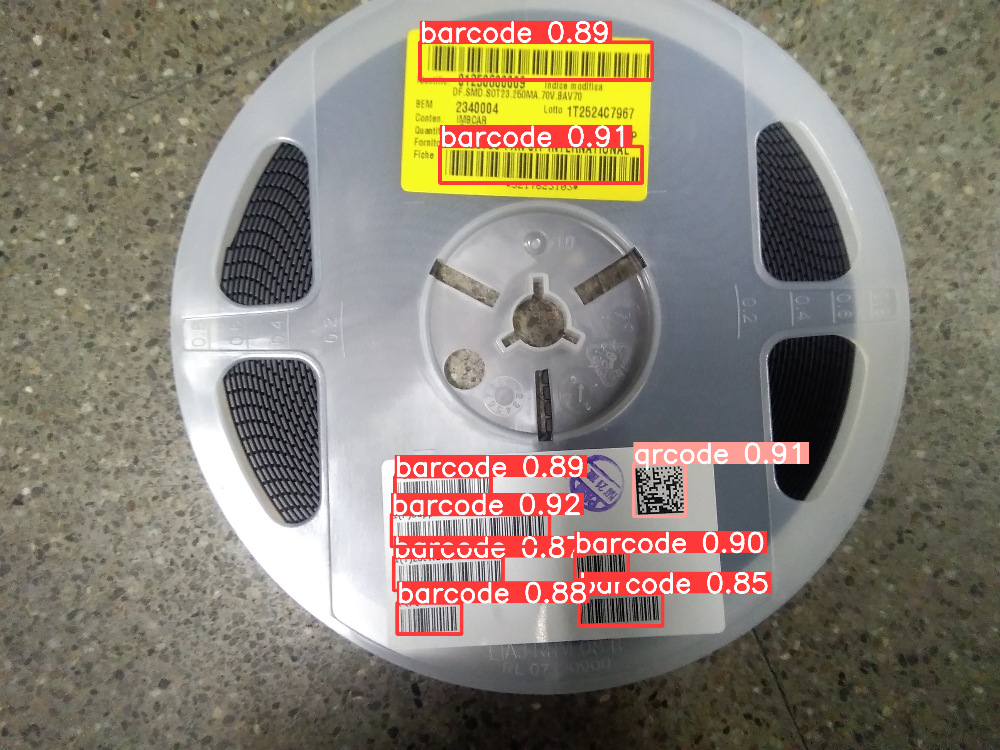

In [15]:
img1 = read_image("./img1.jpg")

boxes = detector.detect_1d2d_codes(img1)

In [16]:
boxes

array([[1014.6, 1333.9, 1424.1, 1417.0, 0.922, 0, 'barcode'],
       [1642.2, 1201.4, 1776.6, 1338.2, 0.908, 1, 'qrcode'],
       [1140.7, 379.5, 1664.5, 474.6, 0.908, 0, 'barcode'],
       [1489.6, 1432.6, 1628.8, 1503.7, 0.899, 0, 'barcode'],
       [1024.0, 1235.5, 1272.3, 1313.6, 0.888, 0, 'barcode'],
       [1088.4, 109.4, 1690.7, 207.4, 0.886, 0, 'barcode'],
       [1029.1, 1562.1, 1196.6, 1643.9, 0.878, 0, 'barcode'],
       [1020.9, 1444.3, 1304.0, 1530.6, 0.871, 0, 'barcode'],
       [1500.2, 1537.2, 1718.0, 1622.4, 0.854, 0, 'barcode']], dtype=object)

image 1/1: 2592x1944 8 barcodes, 1 qrcode
Speed: 3.2ms pre-process, 85.2ms inference, 1.4ms NMS per image at shape (1, 3, 640, 480)


          xmin         ymin         xmax         ymax  confidence  class  \
0   438.143341   916.936523   517.289368  1375.969727    0.928590      0   
1   305.578552   929.978638   393.280304  1234.811768    0.926966      0   
2  1694.229248  1075.767212  1872.604980  1703.726318    0.921512      0   
3   173.912506   932.516418   263.492584  1105.817139    0.919855      0   
4   327.203278  1438.212891   411.552490  1588.732300    0.914697      0   
5  1426.819336  1094.404785  1581.992920  1640.878662    0.912721      0   
6   203.787766  1442.298096   298.931610  1672.076660    0.902561      0   
7   541.642944   927.862061   625.155212  1204.049194    0.901702      0   
8   517.633179  1593.025757   657.103699  1746.758057    0.888446      1   

      name  
0  barcode  
1  barcode  
2  barcode  
3  barcode  
4  barcode  
5  barcode  
6  barcode  
7  barcode  
8   qrcode  


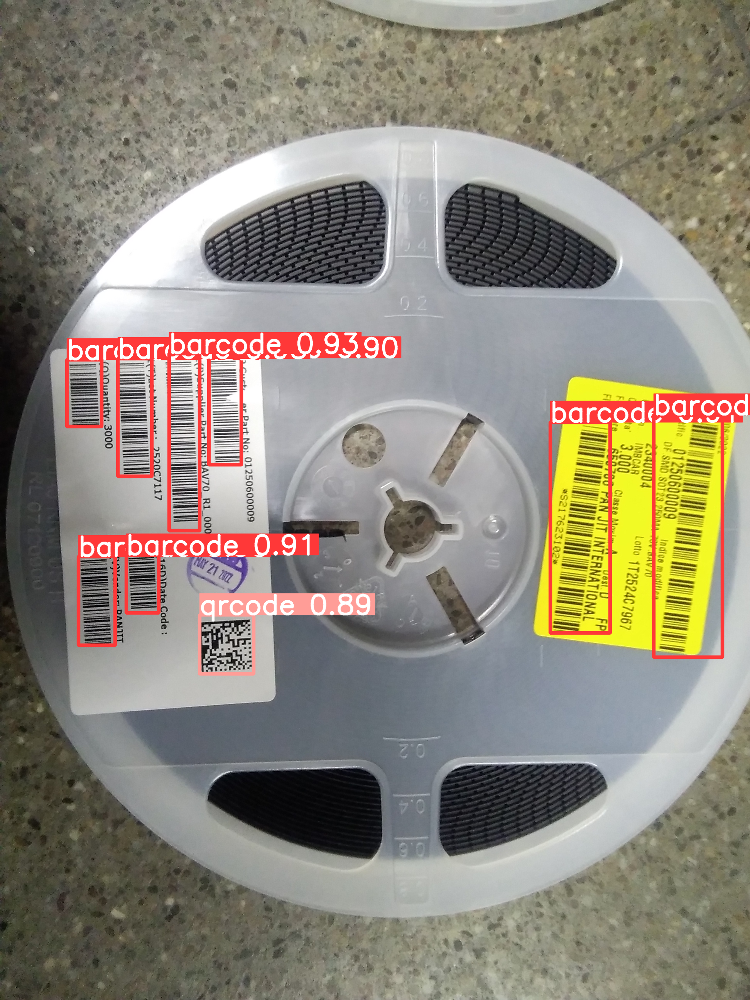

array([[438.1, 916.9, 517.3, 1376.0, 0.929, 0, 'barcode'],
       [305.6, 930.0, 393.3, 1234.8, 0.927, 0, 'barcode'],
       [1694.2, 1075.8, 1872.6, 1703.7, 0.922, 0, 'barcode'],
       [173.9, 932.5, 263.5, 1105.8, 0.92, 0, 'barcode'],
       [327.2, 1438.2, 411.6, 1588.7, 0.915, 0, 'barcode'],
       [1426.8, 1094.4, 1582.0, 1640.9, 0.913, 0, 'barcode'],
       [203.8, 1442.3, 298.9, 1672.1, 0.903, 0, 'barcode'],
       [541.6, 927.9, 625.2, 1204.0, 0.902, 0, 'barcode'],
       [517.6, 1593.0, 657.1, 1746.8, 0.888, 1, 'qrcode']], dtype=object)

In [17]:
img2 = read_image("./img2.jpg")

detector.detect_1d2d_codes(img2)

image 1/1: 1024x614 2 barcodes, 1 qrcode
Speed: 2.4ms pre-process, 77.1ms inference, 1.5ms NMS per image at shape (1, 3, 640, 384)


         xmin        ymin        xmax        ymax  confidence  class     name
0   61.121166  636.666199  523.829285  789.359070    0.894911      0  barcode
1   72.305885  806.473328  510.069733  976.194458    0.892039      0  barcode
2  127.425560  451.558441  465.151947  598.879456    0.855648      1   qrcode


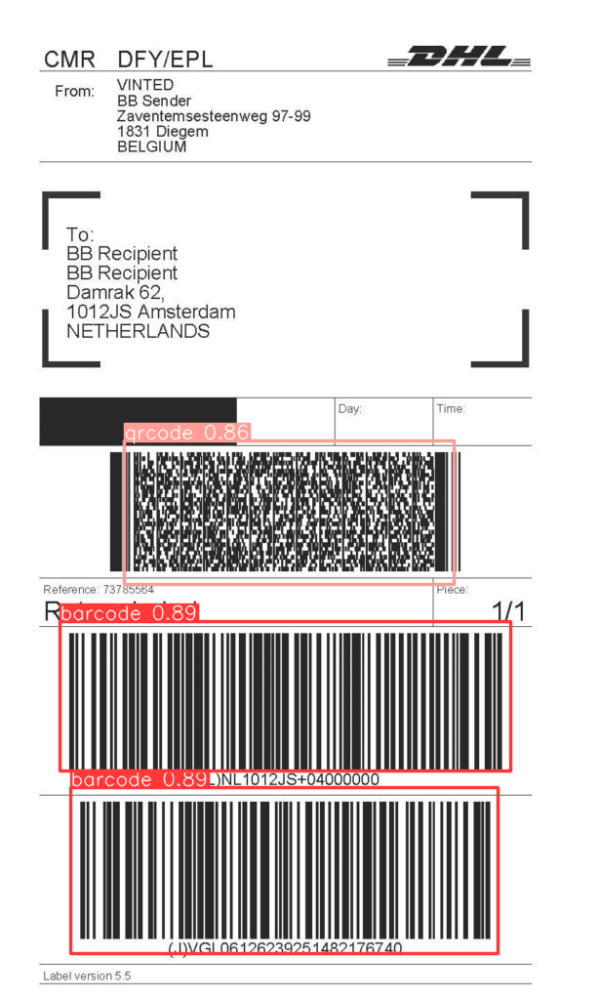

array([[61.1, 636.7, 523.8, 789.4, 0.895, 0, 'barcode'],
       [72.3, 806.5, 510.1, 976.2, 0.892, 0, 'barcode'],
       [127.4, 451.6, 465.2, 598.9, 0.856, 1, 'qrcode']], dtype=object)

In [18]:
img3 = read_image("./img3.jpg")

detector.detect_1d2d_codes(img3)

image 1/1: 1054x1300 3 barcodes, 2 qrcodes
Speed: 3.6ms pre-process, 86.6ms inference, 1.5ms NMS per image at shape (1, 3, 544, 640)


          xmin        ymin         xmax        ymax  confidence  class  \
0   317.162201  657.301697   573.056580  880.072327    0.906810      1   
1   325.516907  370.745453   660.258301  518.821838    0.901355      0   
2   763.960022  739.196411  1231.207764  858.187683    0.804957      0   
3   764.538269  597.028748  1238.474976  848.181458    0.794150      0   
4  1078.243408  231.362061  1121.788574  272.279572    0.636990      1   

      name  
0   qrcode  
1  barcode  
2  barcode  
3  barcode  
4   qrcode  


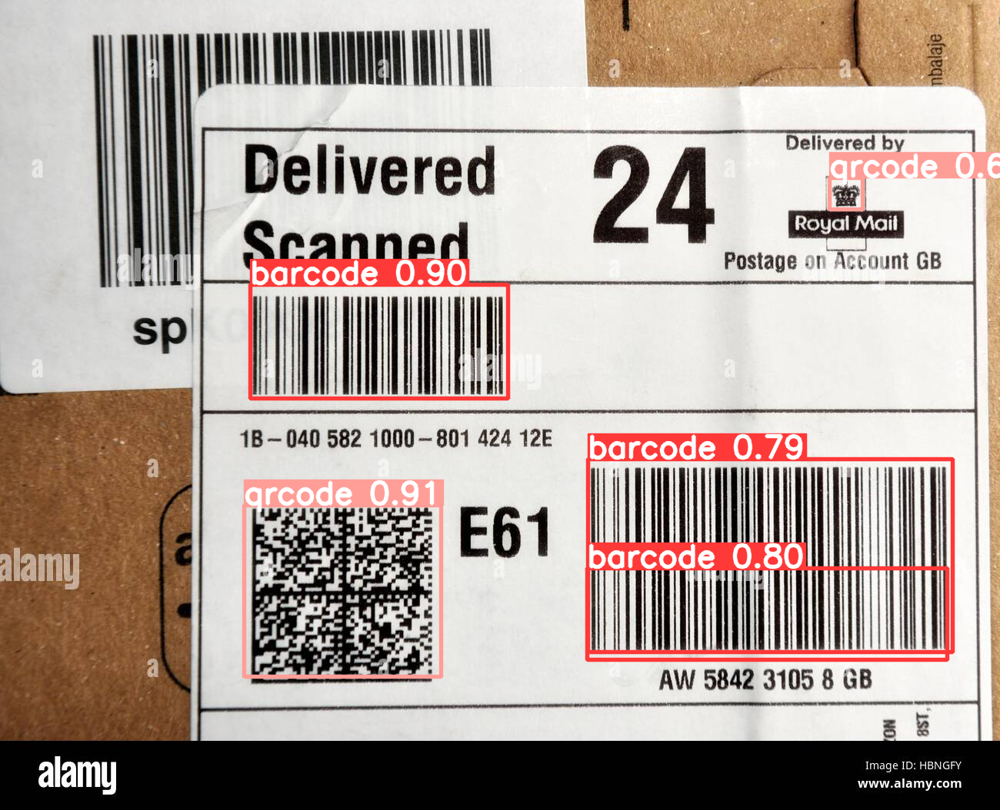

array([[317, 657, 573, 880, 0.907, 1, 'qrcode'],
       [325, 370, 660, 518, 0.901, 0, 'barcode'],
       [763, 739, 1231, 858, 0.805, 0, 'barcode'],
       [764, 597, 1238, 848, 0.794, 0, 'barcode'],
       [1078, 231, 1121, 272, 0.637, 1, 'qrcode']], dtype=object)

In [10]:
img4 = read_image("./img4.jpg")

detector.detect_1d2d_codes(img4)

image 1/1: 445x386 3 barcodes
Speed: 2.7ms pre-process, 92.4ms inference, 1.8ms NMS per image at shape (1, 3, 640, 576)


         xmin        ymin        xmax        ymax  confidence  class     name
0  103.713821  117.358887  284.561798  185.169632    0.884769      0  barcode
1   66.149948  303.809418  271.602448  341.764160    0.845576      0  barcode
2  181.380371  295.305389  272.577759  320.204681    0.668016      0  barcode


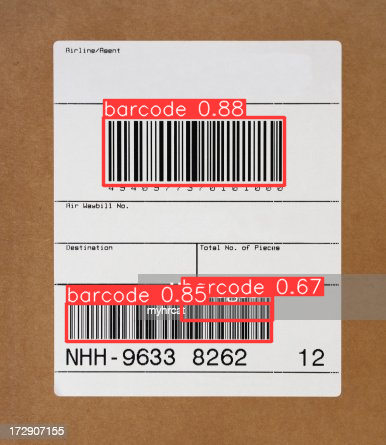

array([[103, 117, 284, 185, 0.885, 0, 'barcode'],
       [66, 303, 271, 341, 0.846, 0, 'barcode'],
       [181, 295, 272, 320, 0.668, 0, 'barcode']], dtype=object)

In [11]:
img5 = read_image("./img5.jpg")

detector.detect_1d2d_codes(img5)

image 1/1: 1584x1134 1 barcode, 1 qrcode
Speed: 3.0ms pre-process, 77.8ms inference, 1.8ms NMS per image at shape (1, 3, 640, 480)


         xmin         ymin         xmax         ymax  confidence  class  \
0  968.605530   158.031296  1132.124146   324.031860    0.915233      1   
1   49.844337  1008.825012  1125.399170  1251.909912    0.832699      0   

      name  
0   qrcode  
1  barcode  


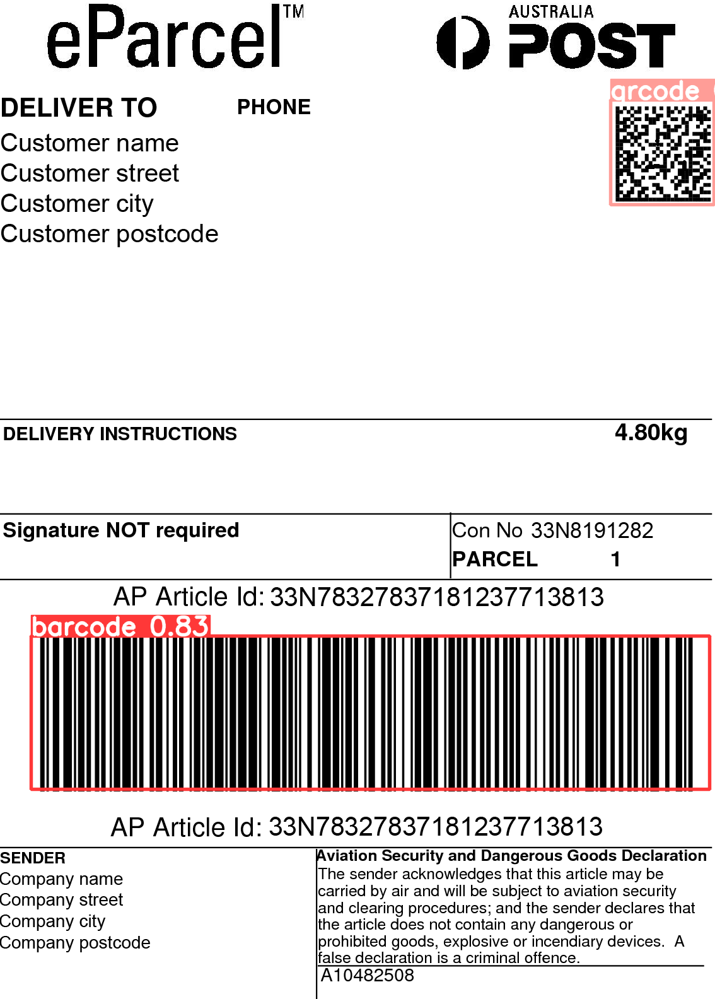

array([[968, 158, 1132, 324, 0.915, 1, 'qrcode'],
       [49, 1008, 1125, 1251, 0.833, 0, 'barcode']], dtype=object)

In [12]:
img6 = read_image("./img6.png")

detector.detect_1d2d_codes(img6)

In [ ]:
type(img6)